In [2]:
# Main figure

import pandas as pd
import folium

PATH = "E:/US_Accidents_March23.csv"
USECOLS = ["State", "City", "Start_Lat", "Start_Lng"]
CHUNKSIZE = 200_000

pitts_list = []

print("Reading file in chunks...")

for chunk in pd.read_csv(PATH, usecols=USECOLS, chunksize=CHUNKSIZE, low_memory=False):
    pitt = chunk[
        (chunk["State"] == "PA") &
        (chunk["City"].str.lower() == "pittsburgh")
    ].dropna(subset=["Start_Lat", "Start_Lng"])
    
    if not pitt.empty:
        pitts_list.append(pitt)

df_pitt = pd.concat(pitts_list, ignore_index=True)
print("Total Pittsburgh accidents loaded:", len(df_pitt))

m = folium.Map(location=[40.44, -79.99], zoom_start=12, tiles="cartodbpositron")

for _, row in df_pitt.iterrows():
    folium.CircleMarker(
        location=[row["Start_Lat"], row["Start_Lng"]],
        radius=2,
        color="blue",
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m


Reading file in chunks...
Total Pittsburgh accidents loaded: 13926


Loading Pittsburgh time data...


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_43784\1288026732.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pitt["Start_Time"] = pd.to_datetime(pitt["Start_Time"], errors="coerce")
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_43784\1288026732.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pitt["Start_Time"] = pd.to_datetime(pitt["Start_Time"], errors="coerce")
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_43784\1288026732.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a

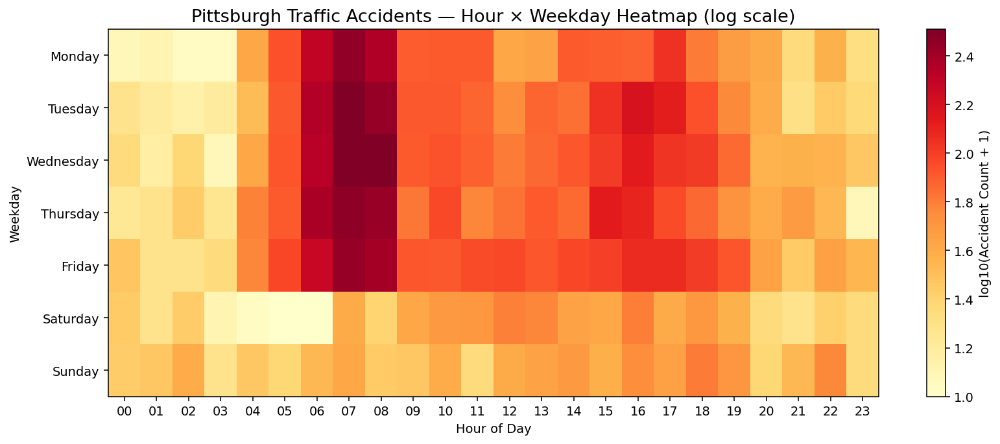

In [3]:
import numpy as np
import matplotlib.pyplot as plt

PATH = "E:/US_Accidents_March23.csv"
CHUNKSIZE = 200_000
USECOLS = ["State", "City", "Start_Time"]

order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
weekday_to_row = {w:i for i,w in enumerate(order)}
heat = np.zeros((7, 24), dtype=np.int64)

print("Loading Pittsburgh time data...")

for chunk in pd.read_csv(PATH, usecols=USECOLS, chunksize=CHUNKSIZE, low_memory=False):
    
    pitt = chunk[
        (chunk["State"] == "PA") &
        (chunk["City"].str.lower() == "pittsburgh")
    ]

    if pitt.empty:
        continue

    pitt["Start_Time"] = pd.to_datetime(pitt["Start_Time"], errors="coerce")
    pitt = pitt.dropna(subset=["Start_Time"])  # Delete unavaliable tiem

    dt = pitt["Start_Time"].dt
    hours = dt.hour
    weekdays = dt.day_name()

    grp = pd.DataFrame({"weekday": weekdays, "hour": hours})
    grp = grp[grp["weekday"].isin(order)]

    counts = grp.groupby(["weekday", "hour"]).size()

    for (w,h), c in counts.items():
        heat[weekday_to_row[w], int(h)] += int(c)

# Log transform
Z = np.log10(heat + 1)

# Plot
fig, ax = plt.subplots(figsize=(12, 5), dpi=140)
im = ax.imshow(Z, aspect="auto", cmap="YlOrRd")

ax.set_xticks(range(24))
ax.set_xticklabels([f"{h:02d}" for h in range(24)])
ax.set_yticks(range(7))
ax.set_yticklabels(order)

plt.title("Pittsburgh Traffic Accidents — Hour × Weekday Heatmap (log scale)", fontsize=14)
plt.xlabel("Hour of Day")
plt.ylabel("Weekday")

cbar = plt.colorbar(im)
cbar.set_label("log10(Accident Count + 1)")

plt.tight_layout()
plt.show()


Loading Pittsburgh weather data...


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_43784\191901240.py:64: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap))


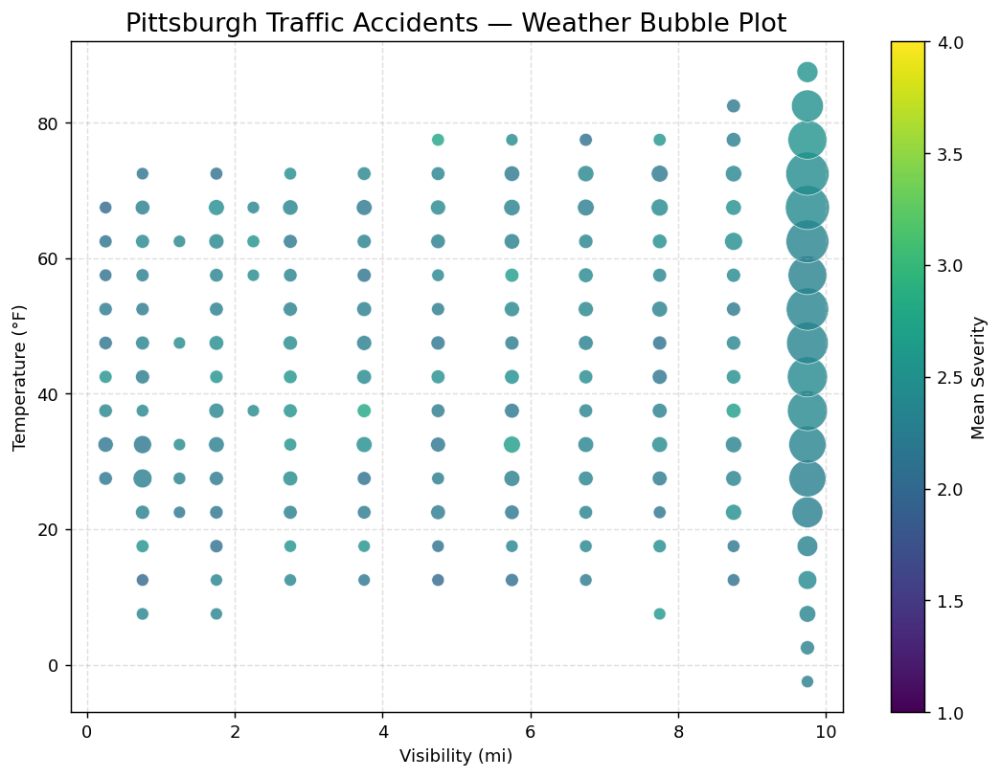

In [4]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

PATH = "E:/US_Accidents_March23.csv"
CHUNKSIZE = 200_000

USECOLS = ["State", "City", "Severity", "Visibility(mi)", "Temperature(F)"]

pitts_list = []

for chunk in pd.read_csv(PATH, usecols=USECOLS, chunksize=CHUNKSIZE, low_memory=False):
    pitt = chunk[
        (chunk["State"] == "PA") &
        (chunk["City"].str.lower() == "pittsburgh")
    ].dropna(subset=["Severity", "Visibility(mi)", "Temperature(F)"])

    if not pitt.empty:
        pitts_list.append(pitt)

df = pd.concat(pitts_list, ignore_index=True)

# Clean values
df["Visibility(mi)"] = pd.to_numeric(df["Visibility(mi)"], errors="coerce")
df["Temperature(F)"] = pd.to_numeric(df["Temperature(F)"], errors="coerce")
df = df.dropna(subset=["Visibility(mi)", "Temperature(F)"])

# Bin visibility & temperature
df["vis_bin"] = pd.cut(df["Visibility(mi)"], bins=np.arange(0, 20.5, 0.5))
df["tmp_bin"] = pd.cut(df["Temperature(F)"], bins=np.arange(-10, 105, 5))

agg = df.groupby(["vis_bin", "tmp_bin"]).agg(
    n=("Severity", "size"),
    severity_mean=("Severity", "mean")
).reset_index()

agg = agg[agg["n"] > 5]

def mid(x):
    return 0.5 * (x.left + x.right)

agg["vis_center"] = agg["vis_bin"].apply(mid)
agg["tmp_center"] = agg["tmp_bin"].apply(mid)

n_min, n_max = agg["n"].min(), agg["n"].max()
sizes = 50 + 600 * (agg["n"] - n_min) / (n_max - n_min)

norm = Normalize(vmin=1, vmax=4)
cmap = plt.colormaps["viridis"]

# Plot
plt.figure(figsize=(10, 7), dpi=130)
plt.scatter(
    agg["vis_center"], agg["tmp_center"],
    s=sizes, c=agg["severity_mean"], cmap=cmap, norm=norm,
    alpha=0.8, edgecolors="white", linewidths=0.4
)

plt.xlabel("Visibility (mi)")
plt.ylabel("Temperature (°F)")
plt.title("Pittsburgh Traffic Accidents — Weather Bubble Plot", fontsize=15)

cbar = plt.colorbar(ScalarMappable(norm=norm, cmap=cmap))
cbar.set_label("Mean Severity")

plt.grid(alpha=0.4, linestyle="--")
plt.show()
